<a href="https://colab.research.google.com/github/carolina-garay/AnalisisYCuracion_Grupo32/blob/carolina_Garay_AyC/Garay_ayc_entregable_parte1_v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Setup
!pip install pandas_profiling==2.8.0
!pip install pandas==1.2.0


**Diplomatura en Ciencia de Datos, Aprendizaje Automático y sus Aplicaciones**

**Exploración y Curación de Datos**

*Edición 2022*

----

# Trabajo práctico entregable - parte 1
Garay Carolina

En esta notebook, vamos a cargar el conjunto de datos de [la compentencia Kaggle](https://www.kaggle.com/dansbecker/melbourne-housing-snapshot) sobre estimación de precios de ventas de propiedades en Melbourne, Australia.

Utilizaremos el conjunto de datos reducido producido por [DanB](https://www.kaggle.com/dansbecker). Hemos subido una copia a un servidor de la Universidad Nacional de Córdoba para facilitar su acceso remoto.

In [37]:
!pip install python-decouple

In [44]:
import io
import matplotlib.pyplot as plt
import gdown

import seaborn as sns
sns.set_context('talk')

from decouple import config
from sqlalchemy import create_engine, text

import plotly
plotly.__version__
# Make sure it's 4.14.3

'5.5.0'

## Ejercicio 1 SQL: 

1. Crear una base de datos en SQLite utilizando la libreria [SQLalchemy](https://stackoverflow.com/questions/2268050/execute-sql-from-file-in-sqlalchemy).
https://docs.sqlalchemy.org/en/14/core/engines.html#sqlite

2. Ingestar los datos provistos en 'https://cs.famaf.unc.edu.ar/~mteruel/datasets/diplodatos/melb_data.csv' en una tabla y el dataset generado en clase con datos de airbnb y sus precios por codigo postal en otra.

3. Implementar consultas en SQL que respondan con la siguiente información:

    - cantidad de registros totales por ciudad.
    - cantidad de registros totales por barrio y ciudad.

4. Combinar los datasets de ambas tablas ingestadas utilizando el comando JOIN de SQL  para obtener un resultado similar a lo realizado con Pandas en clase.  



##EJERCICIO1_Respuestas

1.1 Crear una base de datos en SQLite utilizando la libreria [SQLalchemy](https://stackoverflow.com/questions/2268050/execute-sql-from-file-in-sqlalchemy).
https://docs.sqlalchemy.org/en/14/core/engines.html#sqlite


In [45]:
#Luego de realizar una rápida exploración de los datos
#establecemos conexión a la base de dstos
#Aquí el módulo sqlite3 proporciona una interfaz sencilla para interactuar con bases de datos SQLite.
engine = create_engine('sqlite:///sysarmy.sqlite3', echo=True, connect_args={'timeout': 20})
#engine = create_engine('sqlite:///{}'.format(xxx), connect_args={'timeout': 15})

1.2 Ingestar los datos provistos en 'https://cs.famaf.unc.edu.ar/~mteruel/datasets/diplodatos/melb_data.csv' en una tabla y el dataset generado en clase con datos de airbnb y sus precios por codigo postal en otra.


In [46]:
import numpy as np
import pandas as pd

In [47]:
melb_df = pd.read_csv('https://cs.famaf.unc.edu.ar/~mteruel/datasets/diplodatos/melb_data.csv')

In [48]:
melb_df.to_sql('melb_sql', con=engine, if_exists="replace")

2022-05-22 15:24:36,128 INFO sqlalchemy.engine.Engine PRAGMA main.table_info("melb_sql")
2022-05-22 15:24:36,130 INFO sqlalchemy.engine.Engine [raw sql] ()
2022-05-22 15:24:36,134 INFO sqlalchemy.engine.Engine PRAGMA main.table_info("melb_sql")
2022-05-22 15:24:36,135 INFO sqlalchemy.engine.Engine [raw sql] ()
2022-05-22 15:24:36,139 INFO sqlalchemy.engine.Engine SELECT name FROM sqlite_master WHERE type='table' ORDER BY name
2022-05-22 15:24:36,142 INFO sqlalchemy.engine.Engine [raw sql] ()
2022-05-22 15:24:36,146 INFO sqlalchemy.engine.Engine PRAGMA main.table_info("melb_sql")
2022-05-22 15:24:36,149 INFO sqlalchemy.engine.Engine [raw sql] ()
2022-05-22 15:24:36,155 INFO sqlalchemy.engine.Engine SELECT sql FROM  (SELECT * FROM sqlite_master UNION ALL   SELECT * FROM sqlite_temp_master) WHERE name = ? AND type = 'table'
2022-05-22 15:24:36,159 INFO sqlalchemy.engine.Engine [raw sql] ('melb_sql',)
2022-05-22 15:24:36,162 INFO sqlalchemy.engine.Engine PRAGMA main.foreign_key_list("melb_

OperationalError: ignored

In [20]:
#Lectura del dataset airbnb
#Descargamos el archivo generado en clase desde drive de Carolina 
!gdown https://drive.google.com/file/d/1sUR2Odse85vmQn62yYaEsaUCRJo28Nj2/view?usp=sharing --fuzzy

airbnb_df = pd.read_csv('/content/airbnb_price_by_zipcode.csv')


Downloading...
From: https://drive.google.com/uc?id=1sUR2Odse85vmQn62yYaEsaUCRJo28Nj2
To: /content/airbnb_price_by_zipcode.csv
100% 10.1k/10.1k [00:00<00:00, 11.7MB/s]


In [21]:
airbnb_df.to_sql('airbnb_sql', con=engine, if_exists="replace")

2022-05-22 15:06:50,073 INFO sqlalchemy.engine.Engine PRAGMA main.table_info("airbnb_sql")
2022-05-22 15:06:50,077 INFO sqlalchemy.engine.Engine [raw sql] ()
2022-05-22 15:06:50,083 INFO sqlalchemy.engine.Engine PRAGMA temp.table_info("airbnb_sql")
2022-05-22 15:06:50,085 INFO sqlalchemy.engine.Engine [raw sql] ()
2022-05-22 15:06:50,090 INFO sqlalchemy.engine.Engine BEGIN (implicit)
2022-05-22 15:06:50,109 INFO sqlalchemy.engine.Engine 
CREATE TABLE airbnb_sql (
	"index" BIGINT, 
	zipcode FLOAT, 
	airbnb_price_mean FLOAT, 
	airbnb_record_count BIGINT, 
	airbnb_weekly_price_mean FLOAT, 
	airbnb_monthly_price_mean FLOAT
)


2022-05-22 15:06:50,116 INFO sqlalchemy.engine.Engine [no key 0.00685s] ()
2022-05-22 15:06:50,139 INFO sqlalchemy.engine.Engine CREATE INDEX ix_airbnb_sql_index ON airbnb_sql ("index")
2022-05-22 15:06:50,147 INFO sqlalchemy.engine.Engine [no key 0.00790s] ()
2022-05-22 15:06:50,166 INFO sqlalchemy.engine.Engine COMMIT
2022-05-22 15:06:50,182 INFO sqlalchemy.engine.

In [22]:
#Visualización de columnas de los dataframe airbnb_df y melb_df
print("Columnas de airbnb_df:",airbnb_df.columns)
print("Columnas de melb_df:",melb_df.columns)


Columnas de airbnb_df: Index(['zipcode', 'airbnb_price_mean', 'airbnb_record_count',
       'airbnb_weekly_price_mean', 'airbnb_monthly_price_mean'],
      dtype='object')
Columnas de melb_df: Index(['Suburb', 'Address', 'Rooms', 'Type', 'Price', 'Method', 'SellerG',
       'Date', 'Distance', 'Postcode', 'Bedroom2', 'Bathroom', 'Car',
       'Landsize', 'BuildingArea', 'YearBuilt', 'CouncilArea', 'Lattitude',
       'Longtitude', 'Regionname', 'Propertycount'],
      dtype='object')


In [23]:
 #Recuento de filas de los dataframe
 print(len(airbnb_df))
 print(len(melb_df))

247
13580


3. Implementar consultas en SQL que respondan con la siguiente información:

    - cantidad de registros totales por ciudad.
    - cantidad de registros totales por barrio y ciudad.

In [24]:

# Cantidad de registros totales por ciudad en el dataframe melb_df
query1 = "SELECT CouncilArea, COUNT(CouncilArea) FROM melb_sql GROUP BY CouncilArea"

# Cantidad de registros totales por barrio y ciudad en el dataframe melb_df
query2 = "SELECT CouncilArea, Suburb, COUNT(Suburb) FROM melb_sql GROUP BY Suburb ORDER BY CouncilArea"



In [25]:
#Lista con las consultas 
queries = [query1, query2]


In [ ]:
with engine.connect() as con:
    for query in queries:
      rs = con.execute(query)
      print(query)
      for row in rs:
          print(row)

      print('\n\n')

1.4 Combinar los datasets de ambas tablas ingestadas utilizando el comando JOIN de SQL  para obtener un resultado similar a lo realizado con Pandas en clase.  



In [27]:
airbn_melb_df= engine.connect().execute('SELECT * FROM  melb_sql LEFT JOIN airbnb_sql ON melb_sql.Postcode = airbnb_sql.zipcode')

2022-05-22 15:07:14,389 INFO sqlalchemy.engine.Engine SELECT * FROM  melb_sql LEFT JOIN airbnb_sql ON melb_sql.Postcode = airbnb_sql.zipcode
2022-05-22 15:07:14,394 INFO sqlalchemy.engine.Engine [raw sql] ()


## Ejercicio 2: 

1. Seleccionar un subconjunto de columnas que les parezcan relevantes al problema de predicción del valor de la propiedad. Justificar las columnas seleccionadas y las que no lo fueron.
 - Eliminar los valores extremos que no sean relevantes para la predicción de valores de las propiedades.

2. Agregar información adicional respectiva al entorno de una propiedad a partir del [conjunto de datos de AirBnB](https://www.kaggle.com/tylerx/melbourne-airbnb-open-data?select=cleansed_listings_dec18.csv) utilizado en el práctico. 
  1. Seleccionar qué variables agregar y qué combinaciones aplicar a cada una. Por ejemplo, pueden utilizar solo la columna `price`, o aplicar múltiples transformaciones como la mediana o el mínimo.
  1. Utilizar la variable zipcode para unir los conjuntos de datos. Sólo incluir los zipcodes que tengan una cantidad mínima de registros (a elección) como para que la información agregada sea relevante.
  2. Investigar al menos otras 2 variables que puedan servir para combinar los datos, y justificar si serían adecuadas o no. Pueden asumir que cuentan con la ayuda de anotadores expertos para encontrar equivalencias entre barrios o direcciones, o que cuentan con algoritmos para encontrar las n ubicaciones más cercanas a una propiedad a partir de sus coordenadas geográficas. **NO** es necesario que realicen la implementación.

Pueden leer otras columnas del conjunto de AirBnB además de las que están en `interesting_cols`, si les parecen relevantes.

##EJERCICIO2_Respuestas

1. Seleccionar un subconjunto de columnas que les parezcan relevantes al problema de predicción del valor de la propiedad. Justificar las columnas seleccionadas y las que no lo fueron.
 - Eliminar los valores extremos que no sean relevantes para la predicción de valores de las propiedades.

In [35]:
from pandas_profiling import ProfileReport

ImportError: ignored

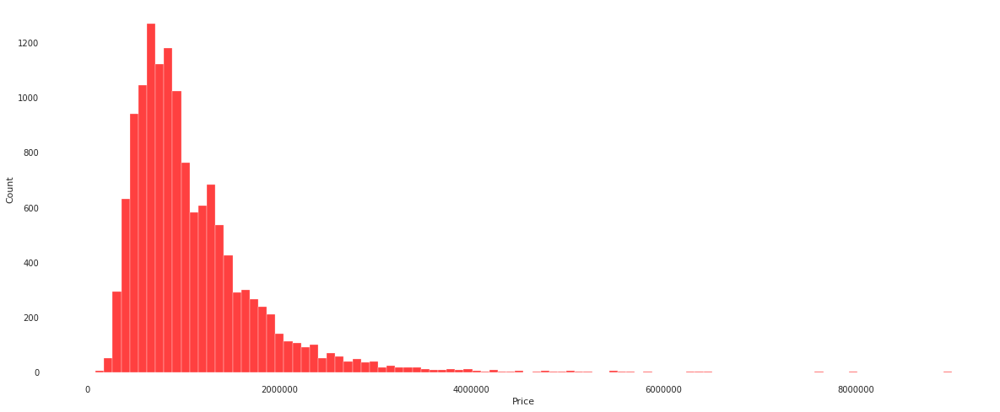

In [ ]:
#Exploración de los datos del dataframe melb_df utilizando pandas_profiling
plt.figure(figsize=(20,8))
sns.histplot(melb_df.Price.dropna(), bins=100, color ='red')
plt.ticklabel_format(style='plain');

#g.refline(x=df_orig[s_neto].min(), color='green', linestyle='--', label="Min = 1 $ARS")
#g.refline(x=df_orig[s_neto].max(), color='red', linestyle='--', label="Max = 2.080.000 $ARS")

In [ ]:
precio='Price'

In [ ]:
# Cálculo de medidas de tendencia central
media_price = melb_df[precio].mean()
mediana_price = melb_df.Price.median() 
moda_price = melb_df.Price.mode()
print("Media:",media_price)
print("Mediana:", mediana_price)
print("Moda:", moda_price)

#Cálculo de valores máximos y mínimos
max_price = melb_df.Price.max()
min_price = melb_df.Price.min()
print("Precio máximo:",max_price)
print("Precio mínimo:", min_price)

Media: 1075684.079455081
Mediana: 903000.0
Moda: 0    1100000.0
dtype: float64
Precio máximo: 9000000.0
Precio mínimo: 85000.0


In [ ]:

# Cálculo de frecuencias para diferentes precios
price_list = [85000, 100000, 200000,3000000,4000000,5000000,6000000,9000000]
prices_list = [84000, 90000, 100000, 200000, 300000, 400000, 500000, 600000, 700000, 800000, 900000, 1000000,2000000,2600000,3000000,4000000,5000000,6000000,9000000]
for s in price_list:
  print(f"Cantidad de casas con precios igual a {str(s)} dólares: ",len(melb_df[melb_df[precio]==float(s)]))
for i in range(len(prices_list) - 1):
   print(f"Cantidad de casas con precios entre {str(prices_list[i])} y {str(prices_list[i+1])} dólares:", len(melb_df[(melb_df[precio] > float(prices_list[i])) & (melb_df[precio] <= float(prices_list[i+1]))]))

Cantidad de casas con precios igual a 85000 dólares:  1
Cantidad de casas con precios igual a 100000 dólares:  0
Cantidad de casas con precios igual a 200000 dólares:  2
Cantidad de casas con precios igual a 3000000 dólares:  11
Cantidad de casas con precios igual a 4000000 dólares:  8
Cantidad de casas con precios igual a 5000000 dólares:  0
Cantidad de casas con precios igual a 6000000 dólares:  0
Cantidad de casas con precios igual a 9000000 dólares:  1
Cantidad de casas con precios entre 84000 y 90000 dólares: 1
Cantidad de casas con precios entre 90000 y 100000 dólares: 0
Cantidad de casas con precios entre 100000 y 200000 dólares: 11
Cantidad de casas con precios entre 200000 y 300000 dólares: 139
Cantidad de casas con precios entre 300000 y 400000 dólares: 509
Cantidad de casas con precios entre 400000 y 500000 dólares: 937
Cantidad de casas con precios entre 500000 y 600000 dólares: 1165
Cantidad de casas con precios entre 600000 y 700000 dólares: 1399
Cantidad de casas con pre

In [ ]:
# Filtrado de la base de datos original y generación de la nueva base de datos
#Elijo datos con una frecuencia mayor a 
melb_new=  melb_df[(melb_df[precio] > 200000) & (melb_df[precio] < 3000000)]

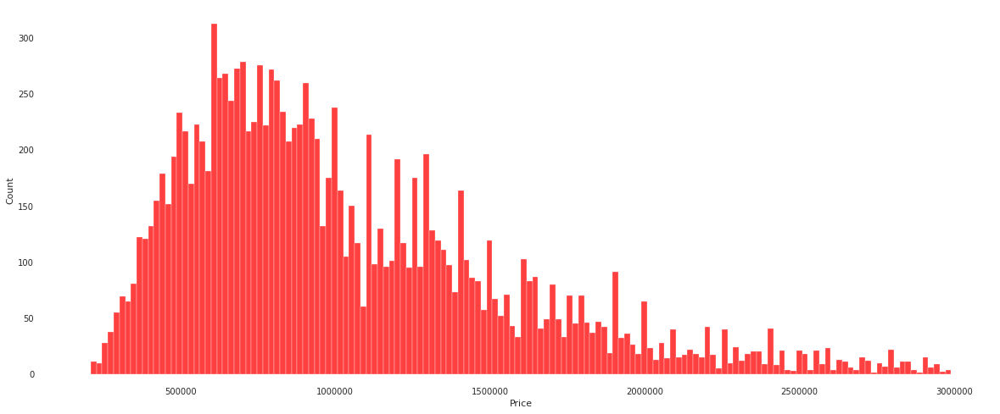

In [ ]:
plt.figure(figsize=(20,8))
sns.histplot(melb_new[precio].dropna(), bins=150, color ='red')
plt.ticklabel_format(style='plain');

In [ ]:
#Análisis estadístico utilizando pandas_profiling
profile = ProfileReport(melb_new)
profile

Summarize dataset:   0%|          | 0/36 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Ejercicio 3:

Crear y guardar un nuevo conjunto de datos con todas las transformaciones realizadas anteriormente.

## Ejercicios opcionales:

1. Armar un script en python (archivo .py) [ETL](https://towardsdatascience.com/what-to-log-from-python-etl-pipelines-9e0cfe29950e) que corra los pasos de extraccion, transformacion y carga, armando una funcion para cada etapa del proceso y luego un main que corra todos los pasos requeridos.

2. Armar un DAG en Apache Airflow que corra el ETL. (https://airflow.apache.org/docs/apache-airflow/stable/tutorial.html)